# Sweep enrichments

Load global analysis variables:

In [1]:
%run standard.py

We look for enrichments in all the 90%-regions

In [2]:
import re, os, sys, pickle, pickle
from pathlib import Path
import numpy
import scipy
import pandas
from pandas import DataFrame, Series
from sklearn.decomposition import PCA
from collections import Counter, defaultdict
import random, bisect

random.seed(7)

import pyfaidx

# my own libaries
from ChromosomeWindows import window
import genominterv

numpy.random.seed(7)

/home/kmt/anaconda3/envs/simons/lib/python3.6/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Plotting setup:

In [3]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D 
# from mpl_toolkits.basemap import Basemap
#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

import mpld3

import seaborn as sns
sns.set() # sets seaborn default "prettyness:
sns.set_style("whitegrid")
sns.set_context("paper")

# lowess for plotting
from statsmodels.nonparametric.smoothers_lowess import lowess

set1 = {'red': '#e41a1c', 'blue': '#377eb8', 'green': '#4daf4a',
        'purple': '#984ea3', 'orange': '#ff7f00', 
        'yellow': '#ffff33', 'brown': '#a65628'}

In /home/kmt/anaconda3/envs/simons/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/kmt/anaconda3/envs/simons/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/kmt/anaconda3/envs/simons/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/kmt/anaconda3/envs/simons/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/kmt/anaconda3/e

Ignore deprecation warnings from mainly seaborn:

In [4]:
# silence deprecation warnings (lots from seaborn)
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
warnings.filterwarnings("ignore", category=numpy.VisibleDeprecationWarning)

Analysis dirs:

In [5]:
root_dir = Path(os.environ['HOME'], 'simons/faststorage/people/kmt')
meta_data_dir = Path(os.environ['HOME'], 'simons/faststorage/data/metadata')
steps_dir = root_dir / 'steps'
argweaver_dir = steps_dir / 'argweaver/output'
results_dir = root_dir / 'results'
figures_dir = root_dir / 'figures'
data_dir = root_dir / 'data'
pi_dir = steps_dir / 'pi_stores'
dist_dir = steps_dir / 'dist_stores'
#pi_dir = root_dir / 'old_pi_stores'
male_x_haploid_dir = steps_dir / 'male_x_haploids'

Local code in the scripts dir on the cluster:

In [6]:
scripts_dir = root_dir / 'scripts'
if str(scripts_dir) not in sys.path:
    sys.path.append(str(scripts_dir))

import simons_meta_data
import hg19_chrom_sizes

from toggle_code_and_errors import toggle_code_html, toggle_errors_html

Import variables global to the entire analysis:

In [7]:
import analysis_globals

## Convenience functions

In [8]:
def silent_nanmean(x):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        return numpy.nanmean(x)
    
def ident_scalar(s):
    x = s.unique()
    assert(len(x)) == 1, x
    return x[0]

## Load meta data

In [9]:
# easy loading of meta data in a consistent manner across code
individuals, populations, regions = simons_meta_data.get_meta_data(meta_data_dir=meta_data_dir)

pop_categories = pandas.read_hdf(str(results_dir / 'population_categories.store'), 'sr')
region_categories = pandas.read_hdf(str(results_dir / 'region_categories.store'), 'sr')

region_colors = dict(zip(list(region_categories), 
                         ['#e41a1c', '#377eb8',  '#984ea3', '#4daf4a',
                          '#ff7f00', '#ffff33', '#a65628']))

chromosome_lengths = dict((k.replace('chr', ''), v) for k, v in hg19_chrom_sizes.hg19_chrom_sizes.items())

reference_genome_file = Path('/home', 'kmt', 'simons', 
                        'faststorage', 'cteam_lite_public3', 'FullyPublic', 'Href.fa')

In [10]:
def genes_overlapping_intervals(genes, peaks):    
    lst = list()
    for tup in peaks.itertuples():
        df = genes.copy().loc[(genes.start < tup.end) & (genes.end > tup.start)]
        df['peak_start'] = tup.start
        df['peak_end'] = tup.end
        lst.append(df)
    return pandas.concat(lst)
        
def genes_in_intervals(genes, peaks):
    pos = genes.start + (genes.end-genes.start)/2
    idx = numpy.equal(numpy.searchsorted(peaks.start, pos) - 1, numpy.searchsorted(peaks.end, pos, side='left'))
    return genes.copy().iloc[idx]

## Sweep peak and region data

In [11]:
sweep_peaks = pandas.read_hdf(results_dir / f'sweep_peaks_{ech_calling_tag}.hdf')

In [12]:
extended_peak_regions_subset = (pandas.read_hdf(results_dir / f'extended_peak_regions_{ech_calling_tag}_90%.hdf')
                        )
extended_peak_regions_subset.head()
extended_peak_regions_subset['start'] = extended_peak_regions_subset.start_pos
extended_peak_regions_subset['end'] = extended_peak_regions_subset.end_pos

## Biomart gene annotation on chrX

In [13]:
biomart_genes_x = pandas.read_hdf(results_dir / 'biomart_genes.hdf').loc[lambda df: df.chrom == 'X']
print(len(biomart_genes_x))
biomart_genes_x.head()

2392


,Gene stable ID,chrom,start,end,strand,Gene type,name
3215,ENSG00000102309,X,71401203,71522776,1,protein_coding,PIN4
3325,ENSG00000186871,X,71424510,71458897,-1,protein_coding,ERCC6L
3382,ENSG00000198034,X,71475529,71497150,-1,protein_coding,RPS4X
3594,ENSG00000102100,X,48760459,48769235,-1,protein_coding,SLC35A2
3815,ENSG00000102096,X,48770459,48776301,-1,protein_coding,PIM2


## Testis genes from human protein atlas

2237 genes show elevated expression in the testis compared to other tissues:

In [14]:
hpatlas_testis_elevated = pandas.read_table(data_dir / 'tissue_specificity_rna_testis_elevated.tsv')
testis_elevated_genes = biomart_genes_x.loc[biomart_genes_x.name.isin(hpatlas_testis_elevated.Gene)]
len(testis_elevated_genes)

191

1079 enriched have at least five-fold higher mRNA levels compared to all other tissues

In [15]:
hpatlas_testis_enriched = pandas.read_table(data_dir / 'tissue_specificity_rna_testis_Tissue.tsv')
testis_enriched_genes = biomart_genes_x.loc[biomart_genes_x.name.isin(hpatlas_testis_enriched.Gene)]
len(testis_enriched_genes)

136

In [16]:
overlap = genes_overlapping_intervals(testis_elevated_genes, extended_peak_regions_subset)
overlap

,Gene stable ID,chrom,start,end,strand,Gene type,name,peak_start,peak_end
28692,ENSG00000147081,X,49955406,49965664,-1,protein_coding,AKAP4,49500000,50000000
29201,ENSG00000147082,X,49967364,50094909,1,protein_coding,CCNB3,49500000,50000000
30740,ENSG00000122824,X,51075083,51080377,1,protein_coding,NUDT10,50800000,51300000
30795,ENSG00000187690,X,51149767,51151687,1,protein_coding,CXorf67,50800000,51300000
30809,ENSG00000196368,X,51232863,51239448,-1,protein_coding,NUDT11,50800000,51300000
47112,ENSG00000196632,X,54219256,54385075,-1,protein_coding,WNK3,54000000,54400000
58085,ENSG00000123496,X,114238538,114254540,-1,protein_coding,IL13RA2,114000000,114400000
40148,ENSG00000123165,X,127184943,127186382,-1,protein_coding,ACTRT1,126800000,127400000
48249,ENSG00000076770,X,131503345,131623996,-1,protein_coding,MBNL3,131200000,131600000
44907,ENSG00000203870,X,154051623,154062937,-1,protein_coding,SMIM9,153900000,154500000


Fisher's exact test show no enrichment:

In [17]:
overlap_all = genes_overlapping_intervals(biomart_genes_x, extended_peak_regions_subset)

nr_prot_overlapping = len(overlap_all.loc[lambda df: df['Gene type'] == 'protein_coding'])
nr_prot_biomart = len(biomart_genes_x.loc[lambda df: df['Gene type'] == 'protein_coding'])

table = [[len(overlap), len(testis_elevated_genes)-len(overlap)],
         [nr_prot_overlapping, nr_prot_biomart-nr_prot_overlapping]]
print(table)

#scipy.stats.fisher_exact([[20, 100],[100, 1000]], alternative='greater')
scipy.stats.fisher_exact(table, alternative='greater')

[[11, 180], [65, 765]]


(0.7192307692307692, 0.8742719557828054)

## All overlapping biomart genes

In [18]:
overlap_all['Gene type'].value_counts()

protein_coding       65
pseudogene           60
miRNA                17
lincRNA              10
snRNA                 9
misc_RNA              6
antisense             5
snoRNA                4
sense_intronic        3
sense_overlapping     1
rRNA                  1
Name: Gene type, dtype: int64

## All overlapping biomart *protein-coding* genes

In [19]:
df = (overlap_all
            #.loc[lambda df: df['Gene type'] == 'protein_coding']
            .loc[lambda df: (df['Gene type'] == 'protein_coding') & (df['Gene type'] != 'pseudogene')]
            .sort_values(['start'])
     )
df.to_hdf(results_dir / 'prot_genes_for_meritxell.hdf', 'df', format='table')
with pandas.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df)

,Gene stable ID,chrom,start,end,strand,Gene type,name,peak_start,peak_end
35582,ENSG00000147010,X,19552093,19905719,-1,protein_coding,SH3KBP1,19600000,20100000
36145,ENSG00000173681,X,19930978,19988416,-1,protein_coding,CXorf23,19600000,20100000
36404,ENSG00000184368,X,20024831,20135035,-1,protein_coding,MAP7D2,19600000,20100000
37079,ENSG00000149970,X,21392536,21672813,1,protein_coding,CNKSR2,21100000,21600000
40854,ENSG00000165164,X,35937851,36008269,1,protein_coding,CXorf22,36000000,36400000
40923,ENSG00000176034,X,36053908,36163187,1,protein_coding,CHDC2,36000000,36400000
40954,ENSG00000205081,X,36246735,36403431,1,protein_coding,CXorf30,36000000,36400000
41022,ENSG00000130962,X,37208528,37316548,1,protein_coding,PRRG1,37200000,37700000
41058,ENSG00000250349,X,37208583,38546928,1,protein_coding,TM4SF2,37200000,37700000
41069,ENSG00000147036,X,37430822,37543716,1,protein_coding,LANCL3,37200000,37700000


## All overlapping biomart *non-coding* genes

In [20]:
df = (overlap_all
            #.loc[lambda df: df['Gene type'] == 'protein_coding']
            .loc[lambda df: (df['Gene type'] != 'protein_coding') & (df['Gene type'] != 'pseudogene')]
            .sort_values(['start']))
df.to_hdf(results_dir / 'noncoding_genes_for_meritxell.hdf', 'df', format='table')
with pandas.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df)

,Gene stable ID,chrom,start,end,strand,Gene type,name,peak_start,peak_end
48163,ENSG00000206663,X,20003176,20003277,-1,misc_RNA,Y_RNA,19600000,20100000
48165,ENSG00000264566,X,20035206,20035305,-1,miRNA,MIR23C,19600000,20100000
48173,ENSG00000206716,X,21232755,21232861,1,snRNA,RNU6-133P,21100000,21600000
48180,ENSG00000266822,X,21581190,21581281,1,miRNA,AL928874.1,21100000,21600000
49075,ENSG00000206733,X,36040056,36040162,-1,snRNA,RNU6-641P,36000000,36400000
49079,ENSG00000226484,X,36383741,36458375,-1,antisense,RP11-87M18.2,36000000,36400000
6638,ENSG00000234390,X,49641327,49643844,-1,lincRNA,USP27X-AS1,49500000,50000000
6671,ENSG00000201341,X,49709947,49710053,-1,snRNA,RNU6-421P,49500000,50000000
6951,ENSG00000207758,X,49767754,49767844,1,miRNA,MIR532,49500000,50000000
6958,ENSG00000207768,X,49768109,49768194,1,miRNA,MIR188,49500000,50000000


## Overlapping Chalmel genes

In [21]:
chalmel_genes = pandas.read_hdf(results_dir / 'chalmel_genes.hdf')

In [22]:
df = chalmel_genes.loc[lambda df: (df.Pattern.isin(['9', '10', '11', '12', '13'])) & (df.chrom == 'X'), 
                  ['name', 'chrom', 'start', 'end', 'Pattern', 'Expression in Testis']]

genes_overlapping_intervals(df, extended_peak_regions_subset)

,name,chrom,start,end,Pattern,Expression in Testis,peak_start,peak_end
2638,MAP7D2,X,20024831,20135035,9,PET,19600000,20100000
3357,XK,X,37545012,37591383,10,IE,37200000,37700000
26,AKAP4,X,49955406,49965664,13,SEHET,49500000,50000000
3018,PAGE4,X,49593863,49598576,10,IE,49500000,50000000
2879,CXorf67,X,51149767,51151687,9,SET,50800000,51300000
5740,XIST,X,73040486,73072588,9,UE,73000000,73500000
379,IL13RA2,X,114238538,114254540,11,IE,114000000,114400000


## Overlapping circRNA from Trine Line

In [23]:
trine_line_x_genes = pandas.read_hdf(results_dir / 'trine_line_x_genes.hdf')

genes_overlapping_intervals(trine_line_x_genes, extended_peak_regions_subset)

,chr,start,end,ccName,ovlpRepExon,ovlpRepRange,strand,size,sumReads,max,median,mean,sumExp,Pattern,Expression.in.Testis,peak_start,peak_end
7200,chrX,19983161,19988416,chrX_19983161-19988416,CXorf23,CXorf23,-,5255,3,3,0.0,0.250000,1,-,-,19600000,20100000
7212,chrX,49962215,49963355,chrX_49962215-49963355,AKAP4,AKAP4,-,1140,2,2,0.0,0.166667,1,13,SEHET,49500000,50000000
7216,chrX,54013510,54014377,chrX_54013510-54014377,PHF8,PHF8,-,867,2,2,0.0,0.166667,1,NaN,NaN,54000000,54400000
7186,chrX,114357089,114364762,chrX_114357089-114364762,LRCH2,LRCH2,-,7673,2,2,0.0,0.166667,1,NaN,NaN,114000000,114400000


## GO enrichment analysis on Gorilla web server

In [24]:
with open(str(results_dir / 'candidate_gene_list.txt'), 'w') as f:
    for name in overlap_all.loc[lambda df: df['Gene type'] == 'protein_coding'].name:
        print(name, file=f)
        
with open(str(results_dir / 'bacground_gene_list.txt'), 'w') as f:
    for name in biomart_genes_x.loc[lambda df: df['Gene type'] == 'protein_coding'].name:
        print(name, file=f)

## Overlap to ampliconic genes

In [25]:
ampliconic_regions = pandas.read_hdf(results_dir / 'ampliconic_regions.hdf')

In [26]:
extended_peak_regions_subset.head()

,pos,peak_start,peak_end,peak_prop_swept,start_pos,end_pos,prop_swept,swept_indivs,start,end
0,19850000.0,19800000,19900000,0.828571,19600000,20100000,0.771429,"['B_Australian-4', 'B_Crete-2', 'B_Dai-4', 'B_...",19600000,20100000
1,21250000.0,21200000,21300000,0.814286,21100000,21600000,0.785714,"['B_Australian-4', 'B_Crete-2', 'B_French-3', ...",21100000,21600000
2,36300000.0,36200000,36400000,0.664286,36000000,36400000,0.635714,"['B_Crete-2', 'B_Dai-4', 'B_French-3', 'B_Han-...",36000000,36400000
3,37500000.0,37300000,37700000,0.507143,37200000,37700000,0.500000,"['B_Crete-2', 'B_Dai-4', 'B_Han-3', 'B_Karitia...",37200000,37700000
4,49750000.0,49500000,50000000,0.528571,49500000,50000000,0.528571,"['B_Australian-4', 'B_French-3', 'B_Papuan-15'...",49500000,50000000


In [27]:
@genominterv.bootstrap('hg19', samples=100000)
def jaccard_test(query, annot):
    return genominterv.jaccard(query, annot)

#jaccard_stat, p_value = jaccard_test(intervals, other_intervals)
    

jaccard_test(extended_peak_regions_subset.assign(chrom = 'chrX'), 
             ampliconic_regions.loc[lambda df: df.chrom == 'X'].assign(chrom='chrX'))

(0.0, 1.0)

Non-random distance to ampliconic reginos not overlapping: Are ampliconic regions not overlapping low pi regions closer the low pi regions than expected?

In [28]:
ampl_reg_not_overlapping = genominterv.interval_diff(ampliconic_regions.loc[lambda df: df.chrom == 'X'],
                                                          extended_peak_regions_subset.assign(chrom = 'X'))
genominterv.proximity_test(ampl_reg_not_overlapping, extended_peak_regions_subset.assign(chrom = 'X'))

TestResult(statistic=0.45343999999999995, pvalue=0.0)

## Overlap to low ILS regions

In [15]:
human_chimp_low_ils_regions_chrX = pandas.read_hdf(results_dir / 'human_chimp_low_ils_regions_chrX.hdf')
human_orang_low_ils_regions_chrX = pandas.read_hdf(results_dir / 'human_orang_low_ils_regions_chrX.hdf')

Human-chimp ILS:

In [76]:
jaccard_test(extended_peak_regions_subset.assign(chrom='chrX'), 
             human_chimp_low_ils_regions_chrX.assign(chrom='chrX'))

(0.13452914798206278, 0.00016)

Human-orang ILS:

In [77]:
jaccard_test(extended_peak_regions_subset.assign(chrom='chrX'), 
             human_orang_low_ils_regions_chrX.assign(chrom='chrX'))

(0.07368421052631578, 0.1255)

## Plot for paper

,start,end
251631,20700000,20800000
251632,20800000,20900000
251633,20900000,21000000
251634,21000000,21100000
251635,21100000,21200000
251636,21200000,21300000
251637,21300000,21400000
251638,21400000,21500000
251639,21500000,21600000
251783,35900000,36000000


In [16]:
human_chimp_low_ils_regions_chrX = pandas.read_hdf(results_dir / 'human_chimp_low_ils_regions_chrX.hdf')
ampliconic_regions = pandas.read_hdf(results_dir / 'ampliconic_regions.hdf')
non_afr_total_swept = pandas.read_hdf(results_dir / f'non_afr_total_swept_{ech_calling_tag}.hdf')

extended_regions = pandas.read_hdf(results_dir / f'extended_peak_regions_{ech_calling_tag}_90%.hdf')

ust_ishim_sweep_inclusion_incl_upgma = pandas.read_hdf(results_dir / f'ust_ishim_sweep_inclusion_incl_upgma_{ech_calling_tag}_90%.hdf')

ust_ishim_sweep_data = pandas.read_hdf(clique_data_with_ust_ishim_file_name)
ust_ishim_ech = ust_ishim_sweep_data.loc[(ust_ishim_sweep_data.swept == True) & (ust_ishim_sweep_data.indiv_1 == 'Ust_Ishim'), ['start', 'end']]

In [17]:
ust_ishim_ech['ech_run'] = (ust_ishim_ech.start.astype(float) != ust_ishim_ech.end.shift()).cumsum()
#ust_ishim_ech.groupby('ech_run').apply(lambda df: pandas.DataFrame(dict(start=[df.start.min()], end=[df.end.max()])))
ust_ishim_ech_coords = ust_ishim_ech.groupby('ech_run').agg(start=("start", "min"), end=("end", "max")).reset_index()
ust_ishim_ech_coords

,ech_run,start,end
0,1,20700000,21600000
1,2,35900000,36600000
2,3,98500000,99200000
3,4,109400000,110900000
4,5,113800000,114500000
5,6,126800000,127600000


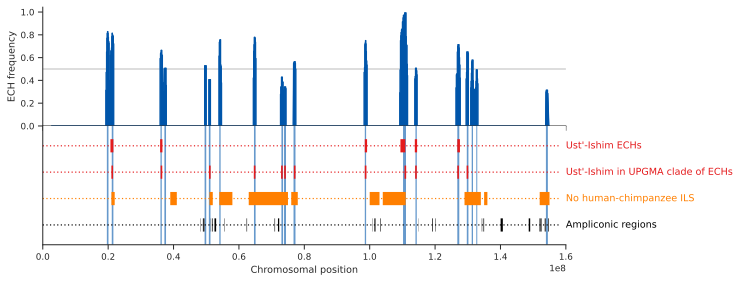

In [19]:
with sns.plotting_context('paper', font_scale=1):
    with sns.axes_style("ticks"):
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 4), sharex=True, sharey=False)

        x = [j for i in zip(non_afr_total_swept.start, non_afr_total_swept.end) for j in i]
        y = [j for i in zip(non_afr_total_swept.prop_swept, non_afr_total_swept.prop_swept) for j in i]      
        g = ax1.plot(x, y, color='#0055AA', zorder=1)        
        ax1.fill_between(x, 0, y, color='#0055AA', zorder=1)

#         ax1.scatter(sweep_peaks.loc[sweep_peaks.prop_swept>=0.5].pos, 
#                    sweep_peaks.loc[sweep_peaks.prop_swept>=0.5].prop_swept + 0.04,
#                    c='gray', marker='*', zorder=5)        
        
#         ax1.axhline(0.5, linestyle=(0, (1, 4)), color='grey', linewidth=1)
        ax1.axhline(0.5, color='black', linewidth=0.2, zorder=0)
    

        for tup in extended_regions.itertuples():
            g = ax2.add_patch(Rectangle((tup.start_pos, 0), tup.end_pos-tup.start_pos, 1, 
                         facecolor='#0055AA',
                         linewidth=0,
                         alpha=0.6,
                         zorder=0))
        
        color = set1['red']
        ax2.plot([0, 158e6], [0.75, 0.75], color=color, linestyle=(0, (1, 2)))
        plt.text(1.6e8, 0.75, "Ust'-Ishim ECHs", horizontalalignment='left', verticalalignment='center', color=color)
        for tup in ust_ishim_ech_coords.itertuples():
            g = ax2.add_patch(Rectangle((tup.start, 0.7), tup.end-tup.start, 0.1, 
                         facecolor=color,
                         linewidth=0,
                         zorder=5))
                
        x = ust_ishim_sweep_inclusion_incl_upgma.loc[ust_ishim_sweep_inclusion_incl_upgma.tishkoff_included, 'peak_pos']
        y = [0.55] * len(x)
        ax2.plot([0, 158e6], [0.55, 0.55], color=color, linestyle=(0, (1, 2)))
        plt.text(1.6e8, 0.55, "Ust'-Ishim in UPGMA clade of ECHs", horizontalalignment='left', verticalalignment='center', color=color)        
        for x, y in zip(x, y):
            g = ax2.add_patch(Rectangle((x-250000, 0.5), 500000, 0.1, 
                         facecolor=color,
                         linewidth=0,
                         zorder=5))
            
        color = set1['orange']
        ax2.plot([0, 158e6], [0.35, 0.35], color=color, linestyle=(0, (1, 2)))
        plt.text(1.6e8, 0.35, "No human-chimpanzee ILS", horizontalalignment='left', verticalalignment='center', color=color)        
        for tup in human_chimp_low_ils_regions_chrX.itertuples():
            g = ax2.add_patch(Rectangle((tup.start, 0.3), tup.end-tup.start, 0.1, 
                         facecolor=color,
                         linewidth=0,
                         alpha=1,
                         zorder=5))

        color = '#000000'
        ax2.plot([0, 158e6], [0.15, 0.15], color=color, linestyle=(0, (1, 2)))
        plt.text(1.6e8, 0.15, "Ampliconic regions", horizontalalignment='left', verticalalignment='center', color=color)                
        for tup in ampliconic_regions.itertuples():
            g = ax2.add_patch(Rectangle((tup.start, 0.1), tup.end-tup.start, 0.1, 
                         facecolor=color,
                         linewidth=0,
                         alpha=1,
                         zorder=5))            

        plt.tight_layout()

        ax1.set_ylim(bottom=0)
        ax1.set_xlim(0,160e6)
        ax1.set_ylabel('ECH frequency')
        ax1.set_ylim(bottom=0)
        
        ax2.set_ylim(0, 0.9)
        ax2.get_yaxis().set_visible(False)
        ax2.set_xlabel('Chromosomal position')

        plt.subplots_adjust(hspace=0)

        sns.despine()
        
        plt.savefig(figures_dir / f'ech_peaks_with_annotation_{ech_calling_tag}.pdf', bbox_inches='tight')


## Total swept with annotations

In [30]:
sweep_data = pandas.read_hdf(results_dir / f'sweep_data_{ech_calling_tag}.hdf')
missing_regions = pandas.read_hdf(results_dir / 'missing_regions.hdf')

plot_df = (sweep_data
           .groupby(['start', 'end', 'region_1', 'region_label_1'], observed=True)['swept']
           .aggregate(['sum', 'size'])
           .rename(columns={'sum': 'nr_swept', 'size': 'total'})
           .reset_index(level=['start', 'end', 'region_1', 'region_label_1'])
          )

plot_df.sort_values(by=['start', 'region_1'], inplace=True)

plot_df['cum_nr_swept'] = (plot_df
                           .loc[plot_df.region_label_1 != 'Africa']
                           .groupby(['start', 'end'])['nr_swept']
                           .transform('cumsum')    
                           )
plot_df['cum_total'] = (plot_df
                        .loc[plot_df.region_label_1 != 'Africa']
                        .groupby(['start', 'end'])['total']
                        .transform('sum')    
                        )
plot_df.head(7)

,start,end,region_1,region_label_1,nr_swept,total,cum_nr_swept,cum_total
0,0,100000,Africa,Africa,0,22,NaN,NaN
1,0,100000,WestEurasia,WestEurasia,0,48,0.0,140.0
2,0,100000,SouthAsia,SouthAsia,0,31,0.0,140.0
3,0,100000,CentralAsiaSiberia,CentralAsiaSiberia,0,10,0.0,140.0
4,0,100000,Oceania,Oceania,0,16,0.0,140.0
5,0,100000,EastAsia,EastAsia,0,27,0.0,140.0
6,0,100000,America,America,0,8,0.0,140.0


Requires this fix to work:
    
    python -m pip install --user "git+https://github.com/javadba/mpld3@display_fix"
    

In [31]:
class ClickInfo(mpld3.plugins.PluginBase):
    """mpld3 Plugin for getting info on click        """

    JAVASCRIPT = """
    mpld3.register_plugin("clickinfo", ClickInfo);
    ClickInfo.prototype = Object.create(mpld3.Plugin.prototype);
    ClickInfo.prototype.constructor = ClickInfo;
    ClickInfo.prototype.requiredProps = ["id", "urls"];
    function ClickInfo(fig, props){
        mpld3.Plugin.call(this, fig, props);
    };

    ClickInfo.prototype.draw = function(){
        var obj = mpld3.get_element(this.props.id);
        urls = this.props.urls;
        obj.elements().on("mousedown",
                          function(d, i){ 
                            window.open(urls[i], '_blank')});
    }
    """
    def __init__(self, points, urls):
        self.points = points
        self.urls = urls
        if isinstance(points, matplotlib.lines.Line2D):
            suffix = "pts"
        else:            
            suffix = None
        self.dict_ = {"type": "clickinfo",
                      "id": mpld3.utils.get_id(points, suffix),
                      "urls": urls}

#ucsc_search = "https://genome-euro.ucsc.edu/cgi-bin/hgTracks?hgsid=226837763_FKVw0jsAcbutCxMf8luSHlzwx2xW&org=Human&db=hg37&position={}&pix=1361"
ucsc_search = "https://genome-euro.ucsc.edu/cgi-bin/hgTracks?db=hg19&pix=2000&position={}&hgsid=230604418_7ASTqKyqNTW8yadJActGtpWwO1V2"
    
# fig, ax = plt.subplots()
# points = ax.scatter(numpy.random.rand(50), numpy.random.rand(50),
#                     s=500, alpha=0.3)
# urls = [ucsc_search.format('CCR5') for i in range(50)]

# # mpld3.plugins.connect(fig, ClickInfo(points, urls))
# # mpld3.display(fig)

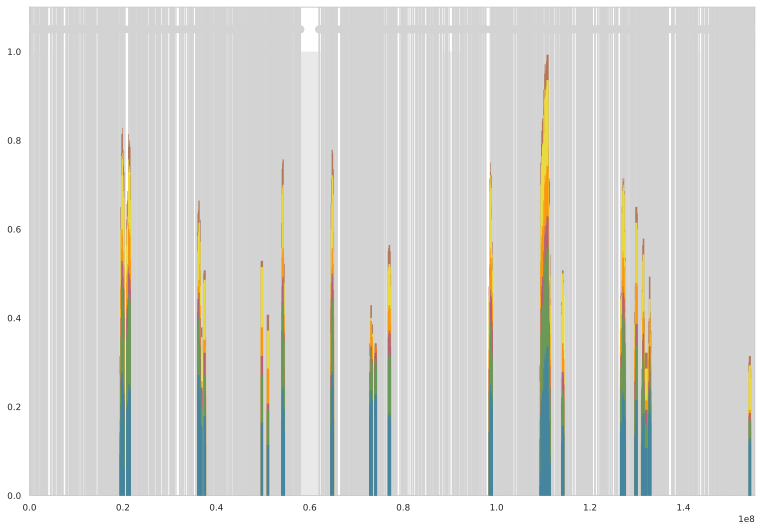

In [32]:
with sns.axes_style("whitegrid", {'axes.grid' : False}):
#     fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(13, 9),                         
#                                    subplot_kw={'xlim':(0, chromosome_lengths['X']), 'ylim':(0, 1)})

    fig, ax1 = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(13, 9),                         
                                   subplot_kw={'xlim':(0, chromosome_lengths['X']), 'ylim':(0, 1.1)})


    zorder = 1

    zorder += 1
    genes = biomart_genes_x
    pos_list = list()
    labels = list()
    for tup in genes.itertuples():
        x = tup.start + (tup.end - tup.start) / 2
        pos_list.append(x)
        labels.append("{}".format(tup.name))
        ax1.add_line(Line2D([x, x], [0, 1.1], color='lightgrey', zorder=zorder))
    zorder += 1        
    scatter = ax1.scatter(pos_list, [1.05 for x in pos_list], c='lightgrey', s=50, zorder=zorder)
    tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
    mpld3.plugins.connect(fig, tooltip)

    urls = [ucsc_search.format(tup.name) for tup in genes.itertuples()]
    mpld3.plugins.connect(fig, ClickInfo(scatter, urls))


#     zorder += 1        
#     genes = chalmel_genes_subset
#     pos_list = list()
#     labels = list()
#     for tup in genes.itertuples():
#         x = tup.start + (tup.end - tup.start) / 2
#         pos_list.append(x)
#         labels.append("{} {}".format(tup.name, tup.Pattern))
#         ax1.add_line(Line2D([x, x], [0, 1.1], color='red', zorder=zorder))
#     zorder += 1        
#     scatter = ax1.scatter(pos_list, [1.05 for x in pos_list], c='red', s=50, zorder=zorder)
#     tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
#     mpld3.plugins.connect(fig, tooltip)
    
#     urls = [ucsc_search.format(tup.name) for tup in genes.itertuples()]
#     mpld3.plugins.connect(fig, ClickInfo(scatter, urls))

    
#     zorder += 1        
#     genes = trine_line_x_genes
#     pos_list = list()
#     labels = list()
#     for tup in genes.itertuples():
#         x = tup.start + (tup.end - tup.start) / 2
#         pos_list.append(x)
#         labels.append("{}".format(tup.ovlpRepExon))
#         ax1.add_line(Line2D([x, x], [0, 1.1], color='pink', zorder=zorder))
#     zorder += 1        
#     scatter = ax1.scatter(pos_list, [1.05 for x in pos_list], c='pink', s=50, zorder=zorder)
#     tooltip = mpld3.plugins.PointLabelTooltip(scatter, labels=labels)
#     mpld3.plugins.connect(fig, tooltip)
    
#     urls = [ucsc_search.format(tup.ovlpRepExon) for tup in genes.itertuples()]
#     mpld3.plugins.connect(fig, ClickInfo(scatter, urls))

    
    regs = [x for x in plot_df.region_1.cat.categories if x != 'Africa'][::-1]
    for reg in regs:
        df = plot_df.loc[plot_df.region_label_1 == reg]
        zorder += 1        
        for tup in df.itertuples():
            if tup.nr_swept:
                g = ax1.add_patch(Rectangle((tup.start, 0), tup.end-tup.start, tup.cum_nr_swept/tup.cum_total, 
                                  facecolor=region_colors[reg], 
                                  linewidth=0,
                                  edgecolor=None,#region_colors[reg], 
                                  zorder=zorder))

#     df = plot_df.loc[plot_df.region_label_1 == 'Africa']
#     for tup in df.itertuples():
#         if tup.nr_swept:
#             g = ax2.add_patch(Rectangle((tup.start, 0), tup.end-tup.start, tup.nr_swept/tup.total, 
#                               facecolor=region_colors['Africa'], 
#                               edgecolor=None,#region_colors[reg], 
#                               ))

    zorder += 1        
    for tup in missing_regions.loc[missing_regions.is_missing == True].itertuples():
        g = ax1.add_patch(Rectangle((tup.start, 0), tup.end-tup.start, 1, 
                 facecolor='lightgray', 
                 #edgecolor=None,
                  linewidth=0,
                 alpha=0.5,
                 zorder=zorder))
#         g = ax2.add_patch(Rectangle((tup.start, 0), tup.end-tup.start, 1, 
#                  facecolor='lightgray', 
#                  edgecolor=None,
#                  alpha=0.5,
#                  zorder=zorder))

  
    plt.savefig(str(figures_dir / "tmp2.pdf"))
    #plt.close() # closing teh plot suppres automatic plotting without plt.show()

#mpld3.display(fig)

## Get descriptions of relevant genes

In [33]:
%env http_proxy=http://in:3128
        
import mygene
from geneinfo import geneinfo, geneplot, get_genes, geneplot, connect_mygene

mg = mygene.MyGeneInfo()
connect_mygene(mg)

env: http_proxy=http://in:3128


In [34]:
non_afr_total_swept = pandas.read_hdf(results_dir / f'non_afr_total_swept_{ech_calling_tag}.hdf') 
non_afr_total_swept.head()

,index,start,end,is_non_african,nr_swept,total,pos,prop_swept
0,1,2700000,2800000,True,0,139,2750000.0,0.0
1,3,2800000,2900000,True,0,140,2850000.0,0.0
2,5,2900000,3000000,True,0,140,2950000.0,0.0
3,7,3000000,3100000,True,0,140,3050000.0,0.0
4,9,3100000,3200000,True,0,140,3150000.0,0.0


In [35]:
def stairs(df, start='start', end='end', pos='pos', endtrim=0):
    "Turn a df with start, end into one with pos to plot as stairs"
    df1 = df.copy(deep=True)
    df2 = df.copy(deep=True)
    df1[pos] = df1[start]
    df2[pos] = df2[end] - endtrim
    return pandas.concat([df1, df2]).sort_values([start, end])

plot_df = stairs(non_afr_total_swept)

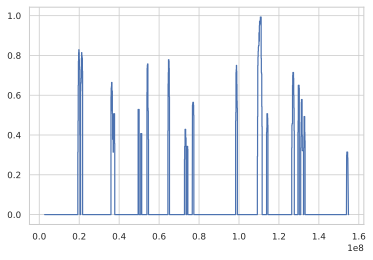

In [36]:
plt.plot(plot_df.pos, plot_df.prop_swept) ;

In [37]:
region_tups = list(extended_peak_regions_subset.itertuples())

def plot_next(i):
    tup = region_tups[i]
    ax = geneplot('chrX', tup.start-5000000, tup.end+5000000, hg19=True, figsize=(12, 5))
    ax.plot(plot_df.pos, plot_df.prop_swept)
    ax.fill_between(plot_df.pos, plot_df.prop_swept, alpha=0.2)
    ax.set_xlim(tup.start-1000000, tup.end+1000000)
    ax.set_ylim(0, 1)
    ax.set_title(f'{tup.start}-{tup.end}');

Fetching 149 gene(s) . . .


KeyError: 'symbol'

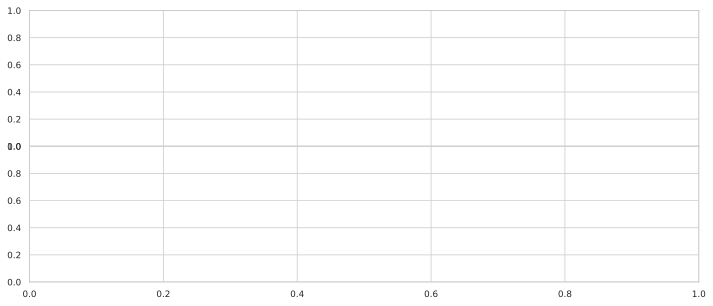

In [38]:
plot_next(0)

In [39]:
geneinfo('BCLAF3')
geneinfo('SH3KBP1')

**Symbol:** **_BCLAF3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf23  
*BCLAF1 and THRAP3 family member 3*  
**Genomic position:** X:19912860-19970298 (hg38), X:19930978-19988416 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=BCLAF3)  


 ----

**Symbol:** **_SH3KBP1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** AGMX2, CD2BP3, CIN85, GIG10, HSB-1, HSB1, IMD61, MIG18  
*SH3 domain containing kinase binding protein 1*  
**Summary:** This gene encodes an adapter protein that contains one or more N-terminal Src homology domains, a proline rich region and a C-terminal coiled-coil domain. The encoded protein facilitates protein-protein interactions and has been implicated in numerous cellular processes including apoptosis, cytoskeletal rearrangement, cell adhesion and in the regulation of clathrin-dependent endocytosis. Alternate splicing results in multiple transcript variants encoding distinct isoforms. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:19533977-19887600 (hg38), X:19552093-19905719 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SH3KBP1)  


 ----

Fetching 137 gene(s) . . .


KeyError: 'symbol'

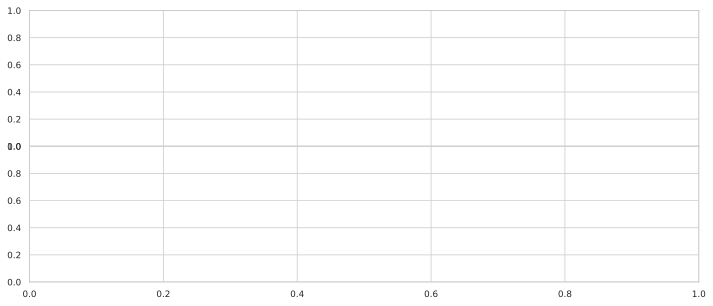

In [40]:
plot_next(1)

In [92]:
geneinfo('CNKSR2')

**Symbol:** **_CNKSR2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CNK2, KSR2, MAGUIN, MRXSHG  
*connector enhancer of kinase suppressor of Ras 2*  
**Summary:** This gene encodes a multidomain protein that functions as a scaffold protein to mediate the mitogen-activated protein kinase pathways downstream from Ras. This gene product is induced by vitamin D and inhibits apoptosis in certain cancer cells. It may also play a role in ternary complex assembly of synaptic proteins at the postsynaptic membrane and coupling of signal transduction to membrane/cytoskeletal remodeling. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Dec 2009].  
**Genomic position:** X:21372801-21654695 (hg38), X:21392536-21672813 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CNKSR2)  


 ----

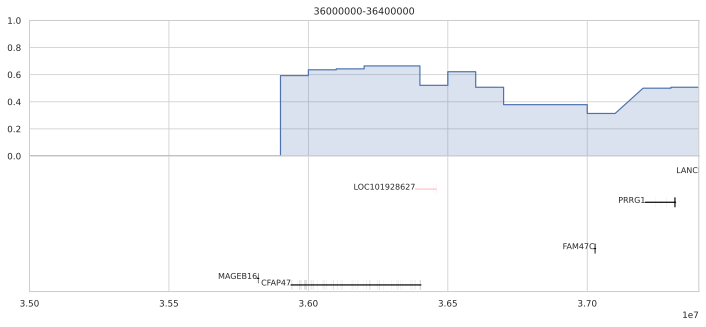

In [93]:
plot_next(2)

In [29]:
geneinfo('CFAP47')

NameError: name 'geneinfo' is not defined

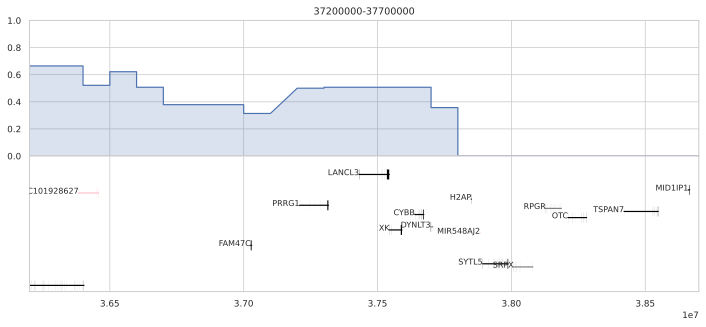

In [94]:
plot_next(3)

In [95]:
geneinfo('DYNLT3')

**Symbol:** **_DYNLT3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** RP3, TCTE1L, TCTEX1L  
*dynein light chain Tctex-type 3*  
**Summary:** This gene encodes a member of a subclass of dynein light chains. The encoded protein homodimerizes and forms the light chain component of the cytoplasmic dynein motor protein complex. This protein may be important for binding dynein to specific cargos including the spindle checkpoint protein BUB3. This protein may also function independently of dynein as a transcriptional modulator. Pseudogenes of this gene are found on chromosomes 2 and 20.[provided by RefSeq, Mar 2010].  
**Genomic position:** X:37836757-37847571 (hg38), X:37696010-37706890 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=DYNLT3)  


 ----

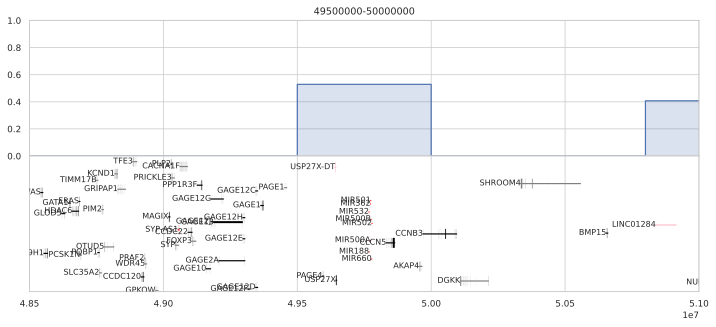

In [96]:
plot_next(4)

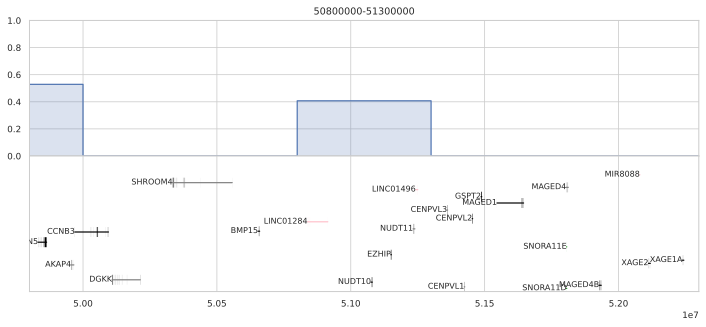

In [97]:
plot_next(5)

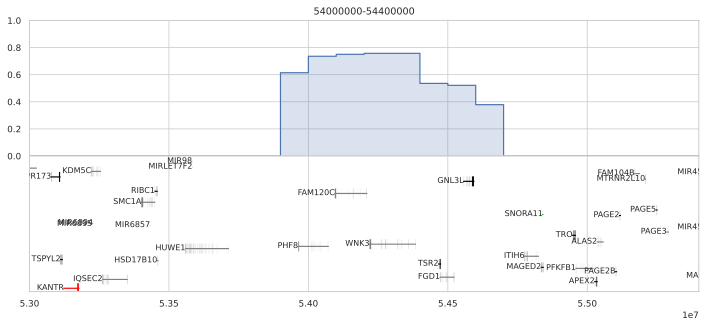

In [98]:
plot_next(6)

In [99]:
geneinfo('PHF8')
geneinfo('WNK3')

**Symbol:** **_PHF8_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** JHDM1F, KDM7B, MRXSSD, ZNF422  
*PHD finger protein 8*  
**Summary:** The protein encoded by this gene is a histone lysine demethylase that preferentially acts on histones in the monomethyl or dimethyl states. The encoded protein requires Fe(2+) ion, 2-oxoglutarate, and oxygen for its catalytic activity. The protein has an N-terminal PHD finger and a central Jumonji C domain. This gene is thought to function as a transcription activator. Defects in this gene are a cause of syndromic X-linked Siderius type intellectual disability (MRXSSD) and over-expression of this gene is associated with several forms of cancer. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:53936676-54048958 (hg38), HG1433_PATCH:53679676-53791958, X:53963109-54075391 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PHF8)  


 ----

**Symbol:** **_WNK3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PRKWNK3  
*WNK lysine deficient protein kinase 3*  
**Summary:** This gene encodes a protein belonging to the 'with no lysine' family of serine-threonine protein kinases. These family members lack the catalytic lysine in subdomain II, and instead have a conserved lysine in subdomain I. This family member functions as a positive regulator of the transcellular Ca2+ transport pathway, and it plays a role in the increase of cell survival in a caspase-3-dependent pathway. Alternative splicing results in multiple transcript variants. [provided by RefSeq, May 2010].  
**Genomic position:** X:54192823-54358642 (hg38), HG1433_PATCH:53935823-54101642, X:54219256-54385075 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=WNK3)  


 ----

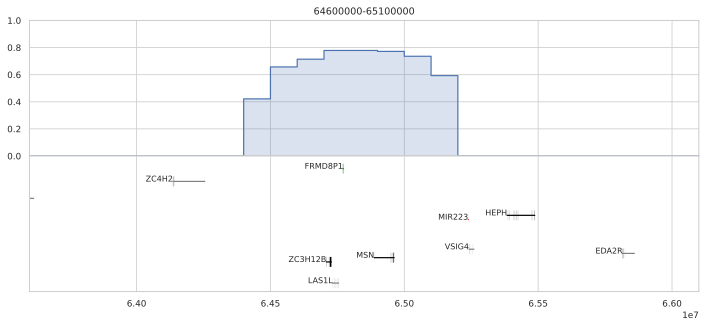

In [100]:
plot_next(7)

In [120]:
[geneinfo(x) for x in ['FRMD8P1', 'ZC3H12B', 'LAS1', 'MSN']] ;

**Symbol:** **_FRMD8P1_**   
*FERM domain containing 8 pseudogene 1*  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=FRMD8P1)  


 ----

**Symbol:** **_ZC3H12B_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf32, MCPIP2  
*zinc finger CCCH-type containing 12B*  
**Summary:** The protein encoded by this gene belongs to a family of CCCH-type zinc finger proteins that are involved in the proinflammatory activation of macrophages. The exact function of this family member is unknown, but it is thought to function as a ribonuclease. [provided by RefSeq, May 2010].  
**Genomic position:** X:65366638-65507887 (hg38), X:64708615-64727767 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ZC3H12B)  


 ----

**Symbol:** **_LAS1L_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** Las1, Las1-like, WTS, dJ475B7.2  
*LAS1 like ribosome biogenesis factor*  
**Genomic position:** X:65512582-65534787 (hg38), X:64732462-64754655 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=LAS1L)  


 ----

**Symbol:** **_MSN_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HEL70, IMD50  
*moesin*  
**Summary:** Moesin (for membrane-organizing extension spike protein) is a member of the ERM family which includes ezrin and radixin. ERM proteins appear to function as cross-linkers between plasma membranes and actin-based cytoskeletons. Moesin is localized to filopodia and other membranous protrusions that are important for cell-cell recognition and signaling and for cell movement. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:65588377-65741931 (hg38), X:64808257-64961791 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MSN)  


 ----

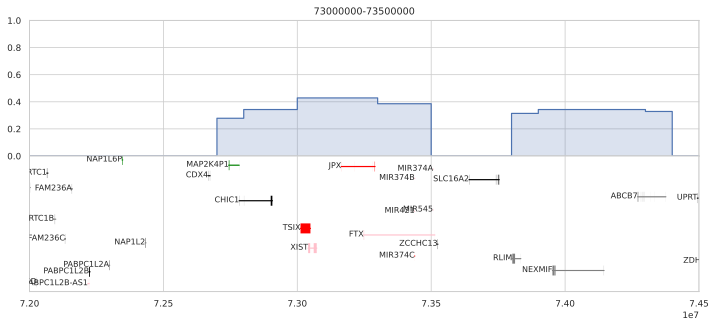

In [101]:
plot_next(8)

In [121]:
[geneinfo(x) for x in ['CHIC1', 'XIST']] ;

**Symbol:** **_CHIC1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BRX  
*cysteine rich hydrophobic domain 1*  
**Summary:** This gene encodes a cysteine-rich hydrophobic (CHIC) domain-containing protein, and is one of the few protein-coding genes found near the X-inactivation center. Studies in mouse indicate that the mouse ortholog of this gene is subject to X-inactivation in mouse. Experiments with other CHIC domain-containing family members show that the cysteine residues are palmitoylated post-translationally, resulting in membrane association. Alternative splicing results in multiple transcript variants encoding different isoforms. [provided by RefSeq, May 2017].  
**Genomic position:** X:73563200-73687102 (hg38), X:72783036-72906937 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CHIC1)  


 ----

**Symbol:** **_XIST_** (ncRNA) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DXS1089, DXS399E, LINC00001, NCRNA00001, SXI1, swd66  
*X inactive specific transcript*  
**Summary:** X inactivation is an early developmental process in mammalian females that transcriptionally silences one of the pair of X chromosomes, thus providing dosage equivalence between males and females. The process is regulated by several factors, including a region of chromosome X called the X inactivation center (XIC). The XIC comprises several non-coding and protein-coding genes, and this gene was the first non-coding gene identified within the XIC. This gene is expressed exclusively from the XIC of the inactive X chromosome, and is essential for the initiation and spread of X-inactivation. The transcript is a spliced RNA. Alternatively spliced transcript variants have been identified, but their full length sequences have not been determined. Mutations in the XIST promoter cause familial skewed X inactivation. [provided by RefSeq, Apr 2012].  
**Genomic position:** X:73820649-73852723 (hg38), X:73040486-73072588 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=XIST)  


 ----

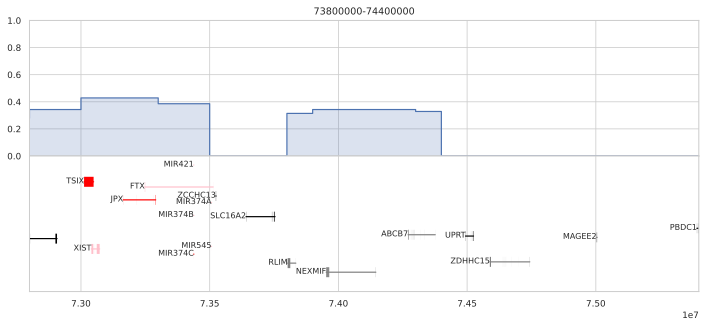

In [102]:
plot_next(9)

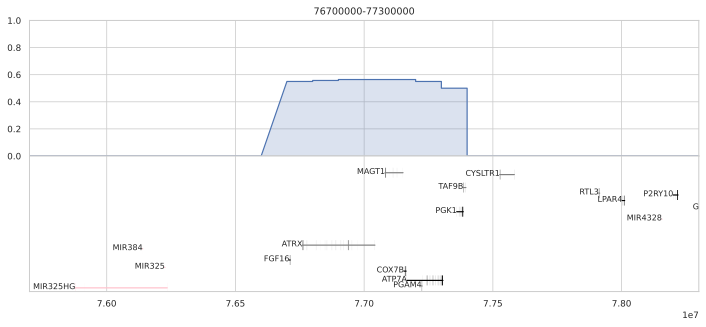

In [103]:
plot_next(10)

In [122]:
[geneinfo(x) for x in ['ATRX', 'MAGT1', 'COX7B', 'ATP7A', 'PGAM4']] ;

**Symbol:** **_ATRX_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** JMS, MRX52, RAD54, RAD54L, XH2, XNP, ZNF-HX  
*ATRX chromatin remodeler*  
**Summary:** The protein encoded by this gene contains an ATPase/helicase domain, and thus it belongs to the SWI/SNF family of chromatin remodeling proteins. This protein is found to undergo cell cycle-dependent phosphorylation, which regulates its nuclear matrix and chromatin association, and suggests its involvement in the gene regulation at interphase and chromosomal segregation in mitosis. Mutations in this gene are associated with X-linked syndromes exhibiting cognitive disabilities as well as alpha-thalassemia (ATRX) syndrome. These mutations have been shown to cause diverse changes in the pattern of DNA methylation, which may provide a link between chromatin remodeling, DNA methylation, and gene expression in developmental processes. Multiple alternatively spliced transcript variants encoding distinct isoforms have been reported. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:77504880-77786233 (hg38), HG1426_PATCH:76765832-77047170, X:76760356-77041702 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ATRX)  


 ----

**Symbol:** **_MAGT1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CDG1CC, IAP, MRX95, OST3B, PRO0756, SLC58A1, XMEN, bA217H1.1  
*magnesium transporter 1*  
**Summary:** This gene encodes a ubiquitously expressed magnesium cation transporter protein that localizes to the cell membrane. This protein also associates with N-oligosaccharyl transferase and therefore may have a role in N-glycosylation. Mutations in this gene cause a form of X-linked intellectual disability (XLID). This gene may have multiple in-frame translation initiation sites, one of which would encode a shorter protein with an N-terminus containing a signal peptide at amino acids 1-29. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:77825747-77895593 (hg38), HG1426_PATCH:77087318-77156547, X:77081861-77151090 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MAGT1)  


 ----

**Symbol:** **_COX7B_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** APLCC, LSDMCA2  
*cytochrome c oxidase subunit 7B*  
**Summary:** Cytochrome c oxidase (COX), the terminal component of the mitochondrial respiratory chain, catalyzes the electron transfer from reduced cytochrome c to oxygen. This component is a heteromeric complex consisting of 3 catalytic subunits encoded by mitochondrial genes and multiple structural subunits encoded by nuclear genes. The mitochondrially-encoded subunits function in electron transfer, and the nuclear-encoded subunits may function in the regulation and assembly of the complex. This nuclear gene encodes subunit VIIb, which is highly similar to bovine COX VIIb protein and is found in all tissues. This gene may have several pseudogenes on chromosomes 1, 2, 20 and 22. [provided by RefSeq, Jun 2011].  
**Genomic position:** X:77899440-77907376 (hg38), HG1426_PATCH:77160392-77168327, X:77154935-77162870 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=COX7B)  


 ----

**Symbol:** **_ATP7A_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DSMAX, MK, MNK, SMAX3  
*ATPase copper transporting alpha*  
**Summary:** This gene encodes a transmembrane protein that functions in copper transport across membranes. This protein is localized to the trans Golgi network, where it is predicted to supply copper to copper-dependent enzymes in the secretory pathway. It relocalizes to the plasma membrane under conditions of elevated extracellular copper, and functions in the efflux of copper from cells. Mutations in this gene are associated with Menkes disease, X-linked distal spinal muscular atrophy, and occipital horn syndrome. Alternatively-spliced transcript variants have been observed. [provided by RefSeq, Aug 2013].  
**Genomic position:** X:77910656-78050395 (hg38), HG1426_PATCH:77171651-77311349, X:77166194-77305892 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ATP7A)  


 ----

**Symbol:** **_PGAM4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PGAM-B, PGAM1, PGAM3, dJ1000K24.1  
*phosphoglycerate mutase family member 4*  
**Summary:** This intronless gene appears to have arisen from a retrotransposition event, yet it is thought to be an expressed, protein-coding gene. The encoded protein is a member of the phosphoglycerate mutase family, a set of enzymes that catalyze the transfer of a phosphate group from 3-phosphoglycerate to 2-phosphoglycerate. [provided by RefSeq, May 2010].  
**Genomic position:** X:77967949-77969638 (hg38), HG1426_PATCH:77228915-77230592, X:77223458-77225135 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PGAM4)  


 ----

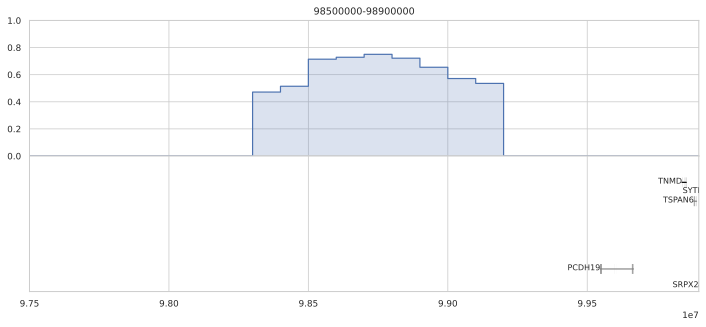

In [104]:
plot_next(11)

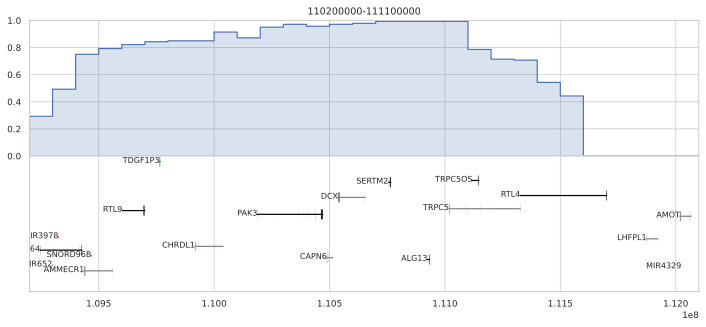

In [105]:
plot_next(12)

In [124]:
[geneinfo(x) for x in ['PAK3', 'CAPN6', 'DCX', 'SERTM2', 'ALG13', 'TRPC5', 'TRPC5OS']] ;

**Symbol:** **_PAK3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** ARA, MRX30, MRX47, OPHN3, PAK-3, PAK3beta, bPAK, beta-PAK  
*p21 (RAC1) activated kinase 3*  
**Summary:** The protein encoded by this gene is a serine-threonine kinase and forms an activated complex with GTP-bound RAS-like (P21), CDC2 and RAC1. This protein may be necessary for dendritic development and for the rapid cytoskeletal reorganization in dendritic spines associated with synaptic plasticity. Defects in this gene are the cause of a non-syndromic form of X-linked intellectual disability. Alternatively spliced transcript variants encoding different isoforms have been identified. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:110944285-111227361 (hg38), X:110187513-110470589 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PAK3)  


 ----

**Symbol:** **_CAPN6_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CANPX, CAPNX, CalpM, DJ914P14.1  
*calpain 6*  
**Summary:** Calpains are ubiquitous, well-conserved family of calcium-dependent, cysteine proteases. The calpain proteins are heterodimers consisting of an invariant small subunit and variable large subunits. The large subunit possesses a cysteine protease domain, and both subunits possess calcium-binding domains. Calpains have been implicated in neurodegenerative processes, as their activation can be triggered by calcium influx and oxidative stress. The protein encoded by this gene is highly expressed in the placenta. Its C-terminal region lacks any homology to the calmodulin-like domain of other calpains. The protein lacks critical active site residues and thus is suggested to be proteolytically inactive. The protein may play a role in tumor formation by inhibiting apoptosis and promoting angiogenesis. [provided by RefSeq, Nov 2009].  
**Genomic position:** X:111245099-111270483 (hg38), X:110488331-110513751 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CAPN6)  


 ----

**Symbol:** **_DCX_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DBCN, DC, LISX, SCLH, XLIS  
*doublecortin*  
**Summary:** This gene encodes a member of the doublecortin family. The protein encoded by this gene is a cytoplasmic protein and contains two doublecortin domains, which bind microtubules. In the developing cortex, cortical neurons must migrate over long distances to reach the site of their final differentiation. The encoded protein appears to direct neuronal migration by regulating the organization and stability of microtubules. In addition, the encoded protein interacts with LIS1, the regulatory gamma subunit of platelet activating factor acetylhydrolase, and this interaction is important to proper microtubule function in the developing cortex. Mutations in this gene cause abnormal migration of neurons during development and disrupt the layering of the cortex, leading to epilepsy, cognitive disability, subcortical band heterotopia ('double cortex' syndrome) in females and lissencephaly ('smooth brain' syndrome) in males. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Sep 2010].  
**Genomic position:** X:111293779-111412429 (hg38), X:110537007-110655603 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=DCX)  


 ----

**Symbol:** **_SERTM2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DKFZp686D0853, LINC00890  
*serine rich and transmembrane domain containing 2*  
**Genomic position:** X:111511662-111522399 (hg38), X:110754890-110765627 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SERTM2)  


 ----

**Symbol:** **_ALG13_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CDG1S, CXorf45, DEE36, EIEE36, GLT28D1, MDS031, TDRD13, YGL047W  
*ALG13 UDP-N-acetylglucosaminyltransferase subunit*  
**Summary:** The protein encoded by this gene is a subunit of a bipartite UDP-N-acetylglucosamine transferase. It heterodimerizes with asparagine-linked glycosylation 14 homolog to form a functional UDP-GlcNAc glycosyltransferase that catalyzes the second sugar addition of the highly conserved oligosaccharide precursor in endoplasmic reticulum N-linked glycosylation. Multiple transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Dec 2009].  
**Genomic position:** X:111665811-111760649 (hg38), X:110909043-111003877 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ALG13)  


 ----

**Symbol:** **_TRPC5_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PPP1R159, TRP5  
*transient receptor potential cation channel subfamily C member 5*  
**Summary:** This gene belongs to the transient receptor family. It encodes one of the seven mammalian TRPC (transient receptor potential channel) proteins. The encoded protein is a multi-pass membrane protein and is thought to form a receptor-activated non-selective calcium permeant cation channel. The protein is active alone or as a heteromultimeric assembly with TRPC1, TRPC3, and TRPC4. It also interacts with multiple proteins including calmodulin, CABP1, enkurin, Na(+)-H+ exchange regulatory factor (NHERF ), interferon-induced GTP-binding protein (MX1), ring finger protein 24 (RNF24), and SEC14 domain and spectrin repeat-containing protein 1 (SESTD1). [provided by RefSeq, May 2010].  
**Genomic position:** X:111774315-112082776 (hg38), X:111017543-111326004 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TRPC5)  


 ----

**Symbol:** **_TRPC5OS_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** TRPC5-AS1  
*TRPC5 opposite strand*  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TRPC5OS)  


 ----

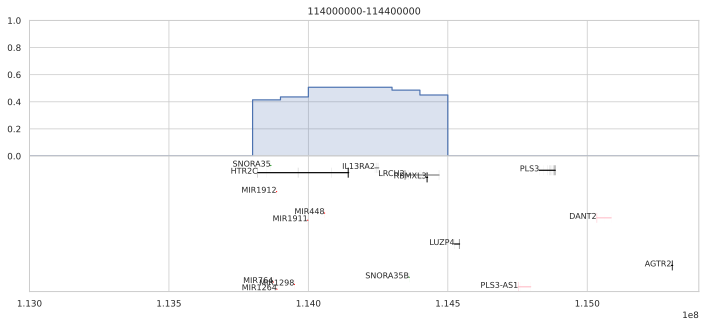

In [107]:
plot_next(13)

In [126]:
[geneinfo(x) for x in ['HTR2C', 'IL13RA2', 'LRCH2', 'RBMXL3']] ;

**Symbol:** **_HTR2C_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** 5-HT1C, 5-HT2C, 5-HTR2C, 5HTR2C, HTR1C  
*5-hydroxytryptamine receptor 2C*  
**Summary:** This gene encodes a seven-transmembrane G-protein-coupled receptor. The encoded protein responds to signaling through the neurotransmitter serotonin. The mRNA of this gene is subject to multiple RNA editing events, where adenosine residues encoded by the genome are converted to inosines. RNA editing is predicted to alter the structure of the second intracellular loop, thereby generating alternate protein forms with decreased ability to interact with G proteins. Abnormalities in RNA editing of this gene have been detected in victims of suicide that suffer from depression. In addition, naturally-occuring variation in the promoter and 5' non-coding and coding regions of this gene may show statistically-significant association with mental illness and behavioral disorders. Alternative splicing results in multiple different transcript variants. [provided by RefSeq, Jan 2015].  
**Genomic position:** X:114584078-114910061 (hg38), HG1462_PATCH:113820548-114146531, X:113818551-114144624 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HTR2C)  


 ----

**Symbol:** **_IL13RA2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CD213A2, CT19, IL-13R, IL13BP  
*interleukin 13 receptor subunit alpha 2*  
**Summary:** The protein encoded by this gene is closely related to Il13RA1, a subuint of the interleukin 13 receptor complex. This protein binds IL13 with high affinity, but lacks cytoplasmic domain, and does not appear to function as a signal mediator. It is reported to play a role in the internalization of IL13. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:115003975-115019977 (hg38), HG1462_PATCH:114240445-114256447, X:114238538-114254540 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=IL13RA2)  


 ----

**Symbol:** **_LRCH2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** dA204F4.4  
*leucine rich repeats and calponin homology domain containing 2*  
**Summary:** This gene encodes a member of the leucine-rich repeat and calponin homology domain-containing protein family. These family members contain multiple N-terminal leucine-rich repeats, in addition to a C-terminal calponin homology domain, a type of domain that mediates interactions with actin filaments. These proteins are conserved across animal species, and studies of a similar Drosophila protein indicate a function as a cytoskeletal scaffolding protein. Alternative splicing of this gene results in multiple transcript variants. [provided by RefSeq, Sep 2011].  
**Genomic position:** X:115110616-115234096 (hg38), HG1462_PATCH:114347092-114470542, X:114345185-114468635 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=LRCH2)  


 ----

**Symbol:** **_RBMXL3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CXorf55  
*RBMX like 3*  
**Genomic position:** X:115189410-115192868 (hg38), HG1462_PATCH:114425870-114429338, X:114423963-114427431 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RBMXL3)  


 ----

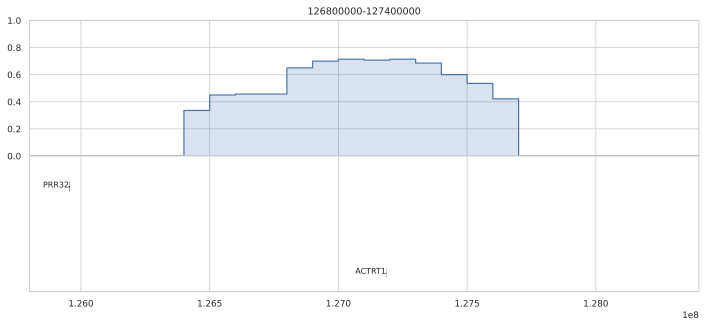

In [108]:
plot_next(14)

In [109]:
geneinfo('ACTRT1')

**Symbol:** **_ACTRT1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** AIP1, ARIP1, ARPT1, HSD27  
*actin related protein T1*  
**Summary:** This gene encodes a protein related to the cytoskeletal protein beta-actin. This protein is a major component of the calyx in the perinuclear theca of mammalian sperm heads, and it therefore likely functions in spermatid formation. This gene is intronless and is similar to a related gene located on chromosome 1. A related pseudogene has also been identified approximately 75 kb downstream of this gene on chromosome X. [provided by RefSeq, May 2010].  
**Genomic position:** X:128050962-128052398 (hg38), X:127184943-127186382 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ACTRT1)  


 ----

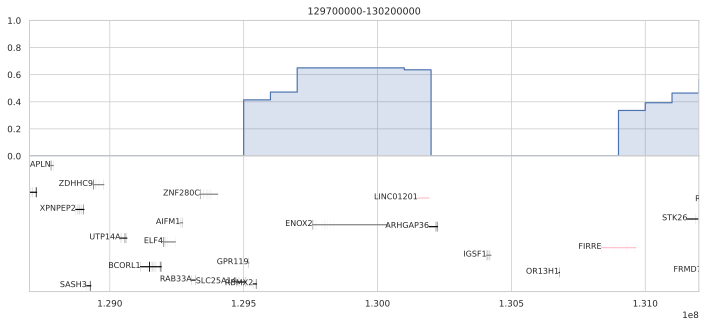

In [110]:
plot_next(15)

In [127]:
geneinfo('ENOX2')
geneinfo('ARHGAP36')

**Symbol:** **_ENOX2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** APK1, COVA1, tNOX  
*ecto-NOX disulfide-thiol exchanger 2*  
**Summary:** This gene is a tumor-specific member of the ECTO-NOX family of genes that encode cell surface NADH oxidases. The encoded protein has two enzymatic activities: catalysis of hydroquinone or NADH oxidation, and protein disulfide interchange. The protein also displays prion-like properties. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Aug 2013].  
**Genomic position:** X:130623369-130903317 (hg38), X:129757350-130037208 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ENOX2)  


 ----

**Symbol:** **_ARHGAP36_** (protein-coding)  
*Rho GTPase activating protein 36*  
**Genomic position:** X:131058346-131089885 (hg38), X:130192216-130223857 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ARHGAP36)  


 ----

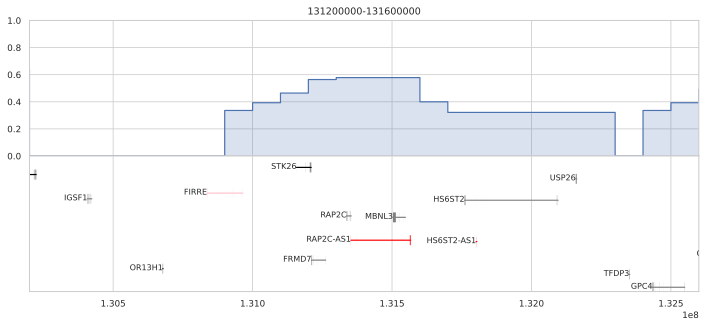

In [112]:
plot_next(16)

In [128]:
[geneinfo(x) for x in ['STK26', 'FRMD7', 'RAP2C', 'MBNL3']] ;

**Symbol:** **_STK26_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** MASK, MST4  
*serine/threonine kinase 26*  
**Summary:** The product of this gene is a member of the GCK group III family of kinases, which are a subset of the Ste20-like kinases. The encoded protein contains an amino-terminal kinase domain, and a carboxy-terminal regulatory domain that mediates homodimerization. The protein kinase localizes to the Golgi apparatus and is specifically activated by binding to the Golgi matrix protein GM130. It is also cleaved by caspase-3 in vitro, and may function in the apoptotic pathway. Several alternatively spliced transcript variants of this gene have been described, but the full-length nature of some of these variants has not been determined. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:132023302-132075943 (hg38), X:131157293-131209971 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=STK26)  


 ----

**Symbol:** **_FRMD7_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** NYS, NYS1, XIPAN  
*FERM domain containing 7*  
**Summary:** Mutations in this gene are associated with X-linked congenital nystagmus. [provided by RefSeq, Dec 2008].  
**Genomic position:** X:132076993-132128020 (hg38), X:131211021-131262048 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=FRMD7)  


 ----

**Symbol:** **_RAP2C_** (protein-coding)  
*RAP2C, member of RAS oncogene family*  
**Summary:** The protein encoded by this gene is a member of the Ras-related protein subfamily of the Ras GTPase superfamily. Members of this family are small GTPases that act as molecular switches to regulate cellular proliferation, differentiation, and apoptosis. This protein has been reported to activate in vitro transcriptional activity of the serum response element. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Sep 2012].  
**Genomic position:** X:132203024-132219480 (hg38), X:131337053-131353471 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RAP2C)  


 ----

**Symbol:** **_MBNL3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CHCR, MBLX, MBLX39, MBXL  
*muscleblind like splicing regulator 3*  
**Summary:** This gene encodes a member of the muscleblind-like family of proteins. The encoded protein may function in regulation of alternative splicing and may play a role in the pathophysiology of myotonic dystrophy. Alternatively spliced transcript variants have been described. [provided by RefSeq, Dec 2009].  
**Genomic position:** X:132369317-132489968 (hg38), X:131503345-131623996 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MBNL3)  


 ----

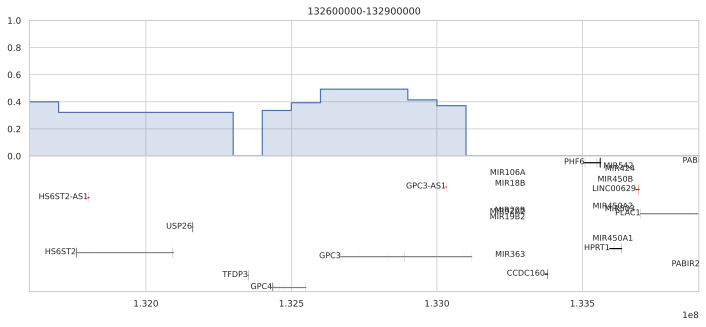

In [113]:
plot_next(17)

In [130]:
[geneinfo(x) for x in ['GPC3', 'GPC4']] ;

**Symbol:** **_GPC3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DGSX, GTR2-2, MXR7, OCI-5, SDYS, SGB, SGBS, SGBS1  
*glypican 3*  
**Summary:** Cell surface heparan sulfate proteoglycans are composed of a membrane-associated protein core substituted with a variable number of heparan sulfate chains. Members of the glypican-related integral membrane proteoglycan family (GRIPS) contain a core protein anchored to the cytoplasmic membrane via a glycosyl phosphatidylinositol linkage. These proteins may play a role in the control of cell division and growth regulation. The protein encoded by this gene can bind to and inhibit the dipeptidyl peptidase activity of CD26, and it can induce apoptosis in certain cell types. Deletion mutations in this gene are associated with Simpson-Golabi-Behmel syndrome, also known as Simpson dysmorphia syndrome. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Sep 2009].  
**Genomic position:** X:133535745-133985594 (hg38), X:132669773-133119922 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=GPC3)  


 ----

**Symbol:** **_GPC4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** K-glypican, KPTS  
*glypican 4*  
**Summary:** Cell surface heparan sulfate proteoglycans are composed of a membrane-associated protein core substituted with a variable number of heparan sulfate chains. Members of the glypican-related integral membrane proteoglycan family (GRIPS) contain a core protein anchored to the cytoplasmic membrane via a glycosyl phosphatidylinositol linkage.  These proteins may play a role in the control of cell division and growth regulation.  The GPC4 gene is adjacent to the 3' end of GPC3 and may also play a role in Simpson-Golabi-Behmel syndrome. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:133300103-133415489 (hg38), X:132434131-132549518 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=GPC4)  


 ----

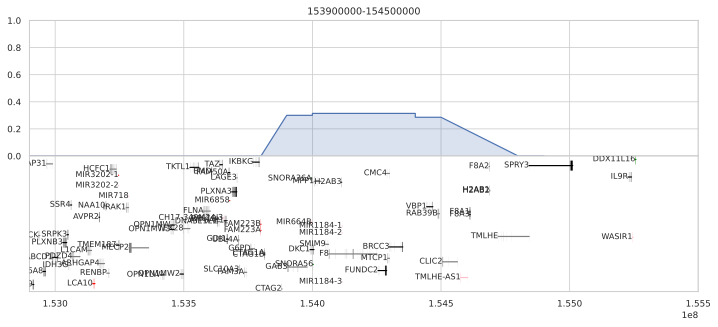

In [114]:
plot_next(18)

In [115]:
from IPython.display import Markdown, display

In [131]:
# for tup in extended_peak_regions_subset.itertuples():
#     lst = [symbol for (symbol, *rest) in get_genes('chrX', tup.start, tup.end, hg19=True)]
#     display(Markdown('**Region {}-{}**'.format(tup.start, tup.end)))
#     print(' '.join(lst))
# #     for record in get_genes('chrX', tup.start, tup.end, hg19=True):
# #         (symbol, *rest) = record
# # #     for gene in mg.query('q=chrX:{}-{}'.format(tup.start, tup.end), species='human', fetch_all=True):
# #         print(symbol)

In [132]:
# for tup in extended_peak_regions_subset.itertuples():
#     display(Markdown('## Region {}-{}'.format(tup.start, tup.end)))
    
#     for record in get_genes('chrX', tup.start, tup.end, hg19=True):
#         (symbol, *rest) = record
# #     for gene in mg.query('q=chrX:{}-{}'.format(tup.start, tup.end), species='human', fetch_all=True):
#         geneinfo(symbol)